# Importing Requirements

In [1]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Conv2DTranspose, InputLayer
import tensorflow.keras.backend as K
import matplotlib.pyplot as plt
from random import randint
import os

os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

# Loading Data

In [2]:
#  Data Paths
DATA_PATH_TRAIN = "LEVIR CD/train" 
DATA_PATH_VAL = "LEVIR CD/val"
DATA_PATH_TEST = "LEVIR CD/test"

# Image Size
IMG_SIZE = 256  # reducing the size depends on model

# Data load functions 
def load_image(path, size=IMG_SIZE):
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  
    img = cv2.resize(img, (size, size))
    img = img / 255.0  # Normalize
    return img

def load_mask(path, size=IMG_SIZE):
    mask = cv2.imread(path, cv2.IMREAD_GRAYSCALE)  
    mask = cv2.resize(mask, (size, size))
    mask = mask / 255.0
    mask = np.expand_dims(mask, axis=-1)  # (H,W,1)
    return mask

def create_dataset(data_path, size=IMG_SIZE, max_samples=500):
    A_path = os.path.join(data_path, "A")
    B_path = os.path.join(data_path, "B")
    label_path = os.path.join(data_path, "label")

    images = []
    masks = []

    file_names = os.listdir(A_path)[:max_samples]

    for fname in file_names:
        imgA = load_image(os.path.join(A_path, fname), size)
        imgB = load_image(os.path.join(B_path, fname), size)
        mask = load_mask(os.path.join(label_path, fname), size)

        # İki görüntüyü yan yana kanal olarak birleştir (6 kanal)
        img = np.concatenate([imgA, imgB], axis=-1)  # (H,W,6)

        images.append(img)
        masks.append(mask)

    images = np.array(images, dtype=np.float32)
    masks = np.array(masks, dtype=np.float32)

    return images, masks

# Load Data
X_train,Y_train = create_dataset(DATA_PATH_TRAIN)
X_val,Y_val = create_dataset(DATA_PATH_VAL)
X_test,Y_test = create_dataset(DATA_PATH_TEST)
print(f"Veri seti şekli: {X_train.shape}, Mask shape: {Y_train.shape}")

Veri seti şekli: (445, 256, 256, 6), Mask shape: (445, 256, 256, 1)


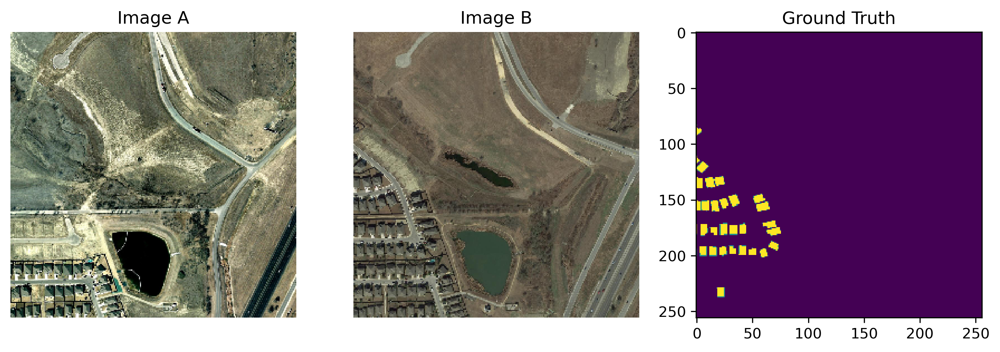

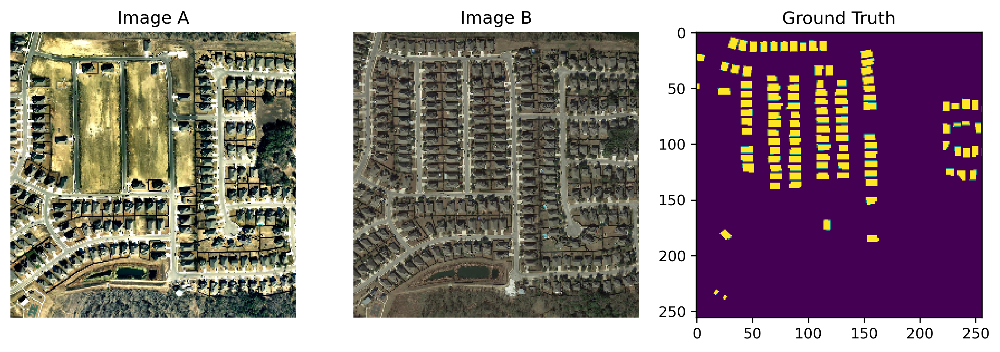

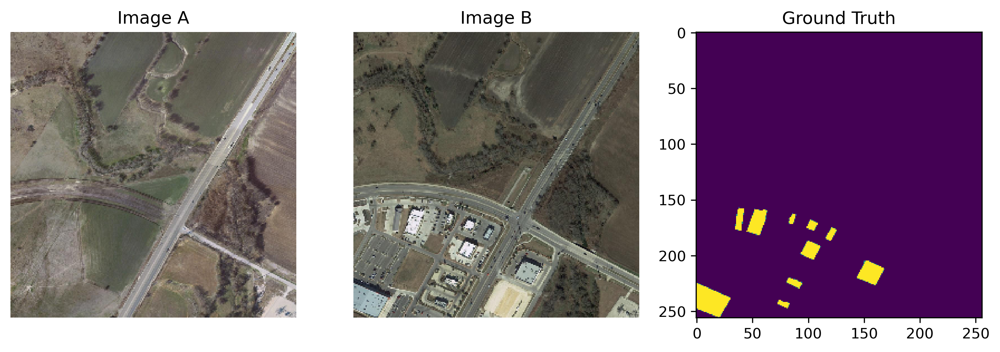

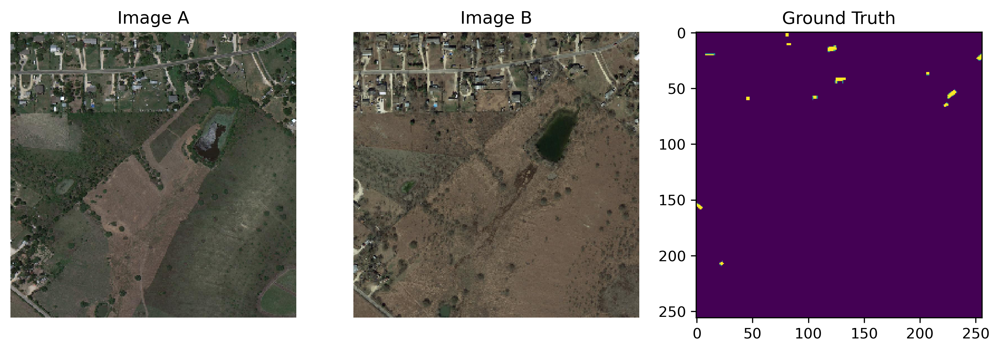

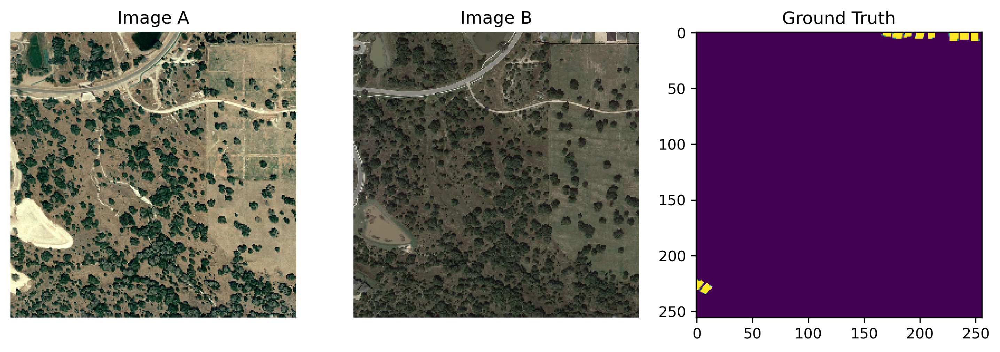

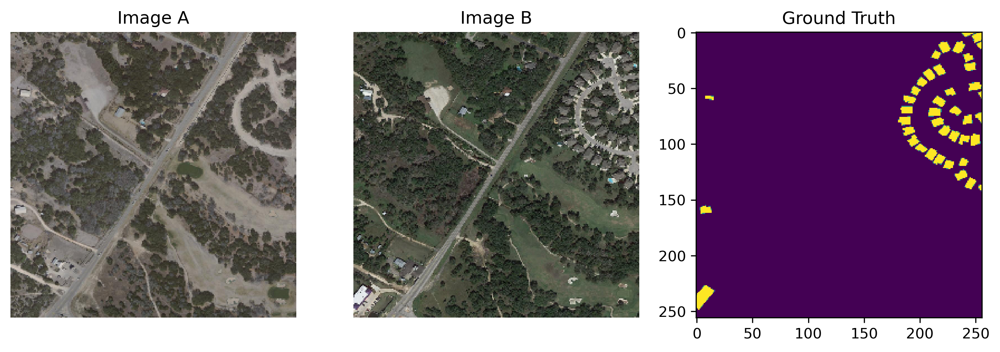

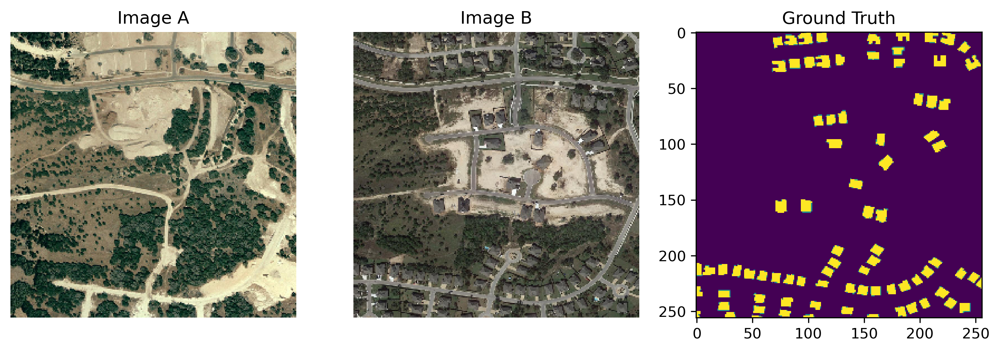

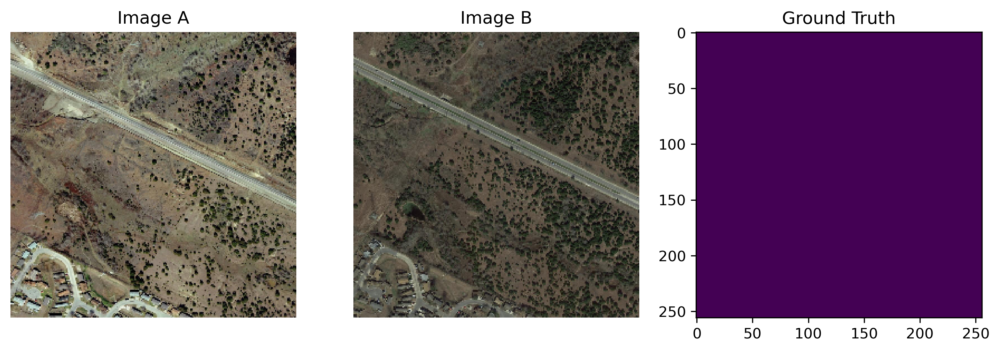

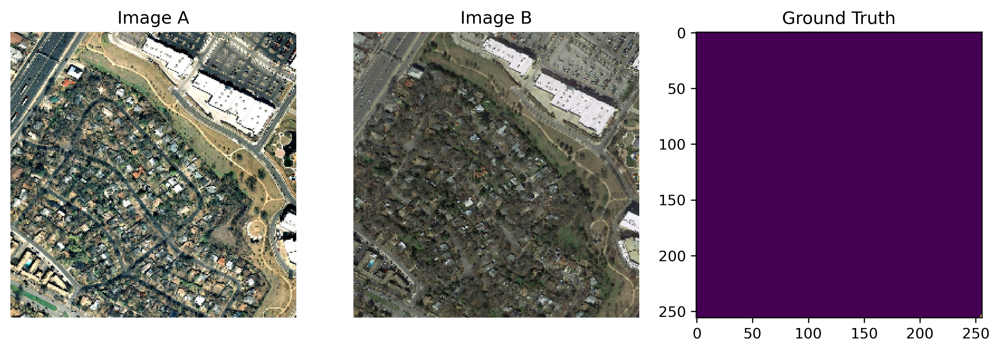

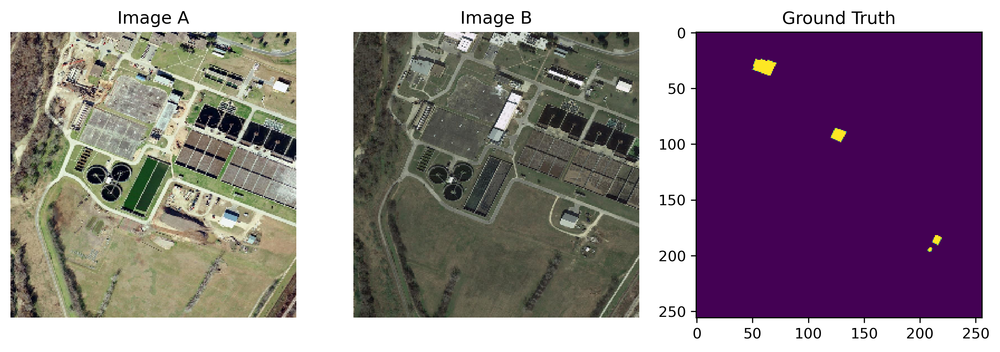

In [3]:
# Visualizing Dataset Samples
def plot_dataset_sample(index):
    plt.figure(figsize=(12,4),dpi=300)

    # First timezone Image Samples
    plt.subplot(1,3,1)
    plt.title("Image A")
    plt.imshow(X_train[index][..., :3])  
    plt.axis('off')

    # Second timezone Image Samples
    plt.subplot(1,3,2)
    plt.title("Image B")
    plt.imshow(X_train[index][..., 3:6])  
    plt.axis('off')

    plt.subplot(1,3,3)
    plt.title("Ground Truth")
    plt.imshow(Y_train[index])

#Show 5 Sample
for i in range(10):
    x = randint(1,400)
    plot_dataset_sample(x)

#### Custom Model Metric 

In [4]:
# This is a performance metric used to evaluate the accuracy of annotation, segmentation, and object detection algorithms.
def iou_metric(y_true, y_pred, smooth=1e-6):
    y_pred = K.cast(y_pred > 0.5, 'float32')
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

# Building Model

# Creating Model Function
def build_model(input_shape=(IMG_SIZE, IMG_SIZE, 6)):
    model = Sequential()
    model.add(InputLayer(input_shape=input_shape))

    # Encoder
    model.add(Conv2D(32, (3,3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2,2)))

    model.add(Conv2D(64, (3,3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2,2)))

    # Decoder
    model.add(Conv2DTranspose(64, (3,3), strides=2, activation='relu', padding='same'))
    model.add(Conv2DTranspose(32, (3,3), strides=2, activation='relu', padding='same'))

    # Last Layer (Predict Mask)
    model.add(Conv2D(1, (1,1), activation='sigmoid', padding='same'))

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=["accuracy",iou_metric])
    return model

# Creating Model
base_model = build_model()
base_model.summary()

In [7]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import InputLayer, Conv2D, MaxPooling2D, UpSampling2D
from tensorflow.keras.optimizers import Adam

def build_model(input_shape=(IMG_SIZE, IMG_SIZE, 6)):
    model = Sequential()
    model.add(InputLayer(input_shape=input_shape))

    # Encoder
    model.add(Conv2D(32, (3,3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2,2)))

    model.add(Conv2D(64, (3,3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2,2)))

    # Decoder - Conv2DTranspose yerine UpSampling + Conv2D
    model.add(UpSampling2D(size=(2,2), interpolation='bilinear'))
    model.add(Conv2D(64, (3,3), activation='relu', padding='same'))

    model.add(UpSampling2D(size=(2,2), interpolation='bilinear'))
    model.add(Conv2D(32, (3,3), activation='relu', padding='same'))

    # Last Layer (Predict Mask)
    model.add(Conv2D(1, (1,1), activation='sigmoid', padding='same'))

    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy', iou_metric])
    return model
base_model = build_model() 
base_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 256, 256, 32)      1760      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 64, 64, 64)       0         
 2D)                                                             
                                                                 
 up_sampling2d (UpSampling2D  (None, 128, 128, 64)     0         
 )                                                               
                                                        

In [8]:
history = base_model.fit(
    X_train, Y_train,
    validation_data=(X_val, Y_val),
    epochs=100,
    batch_size=8
)

Epoch 1/100
56/56 [==============================] - 39s 684ms/step - loss: 0.2454 - accuracy: 0.9500 - iou_metric: 2.8067e-04 - val_loss: 0.1989 - val_accuracy: 0.9547 - val_iou_metric: 5.1633e-11
Epoch 2/100
56/56 [==============================] - 41s 730ms/step - loss: 0.2022 - accuracy: 0.9504 - iou_metric: 4.9129e-11 - val_loss: 0.1887 - val_accuracy: 0.9547 - val_iou_metric: 5.1633e-11
Epoch 3/100
56/56 [==============================] - 41s 737ms/step - loss: 0.1856 - accuracy: 0.9504 - iou_metric: 4.9956e-11 - val_loss: 0.1688 - val_accuracy: 0.9547 - val_iou_metric: 5.1633e-11
Epoch 4/100
56/56 [==============================] - 41s 726ms/step - loss: 0.1621 - accuracy: 0.9505 - iou_metric: 8.9792e-04 - val_loss: 0.1290 - val_accuracy: 0.9547 - val_iou_metric: 5.1633e-11
Epoch 5/100
56/56 [==============================] - 41s 727ms/step - loss: 0.1413 - accuracy: 0.9506 - iou_metric: 0.0060 - val_loss: 0.1172 - val_accuracy: 0.9560 - val_iou_metric: 0.0833
Epoch 6/100
56/56 

In [17]:
base_model.save("main_model.h5")

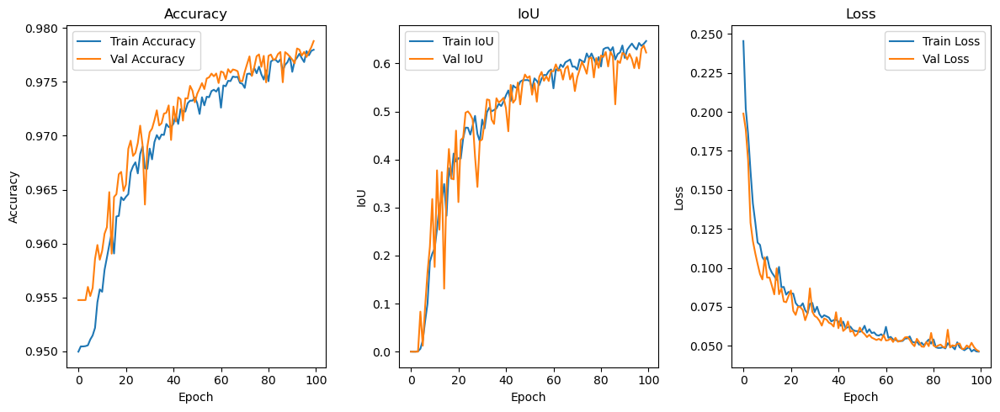

In [10]:
# Visualizing History
def plot_training_history(history):
    # Accuracy
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    # IoU Metric
    plt.subplot(1, 3, 2)
    plt.plot(history.history['iou_metric'], label='Train IoU')
    plt.plot(history.history['val_iou_metric'], label='Val IoU')
    plt.title('IoU')
    plt.xlabel('Epoch')
    plt.ylabel('IoU')
    plt.legend()

    # Loss
    plt.subplot(1, 3, 3)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title('Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_training_history(history)

# Testing Model Results

In [11]:
test_loss, test_acc, test_iou = base_model.evaluate(X_test, Y_test)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Test IoU: {test_iou:.4f}")

4/4 [==============================] - 3s 577ms/step - loss: 0.0573 - accuracy: 0.9733 - iou_metric: 0.6190
Test Loss: 0.0573
Test Accuracy: 0.9733
Test IoU: 0.6190


1/1 [==============================] - 0s 37ms/step


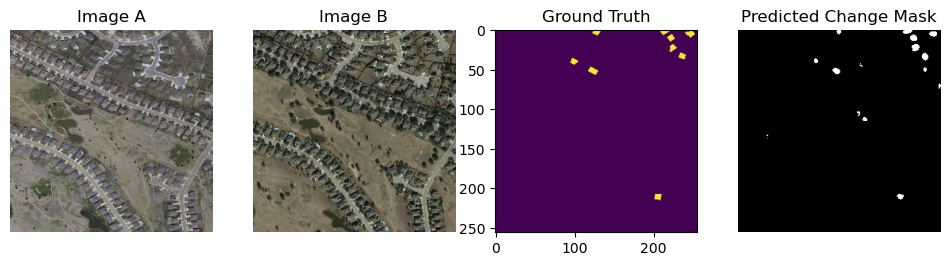

1/1 [==============================] - 0s 35ms/step


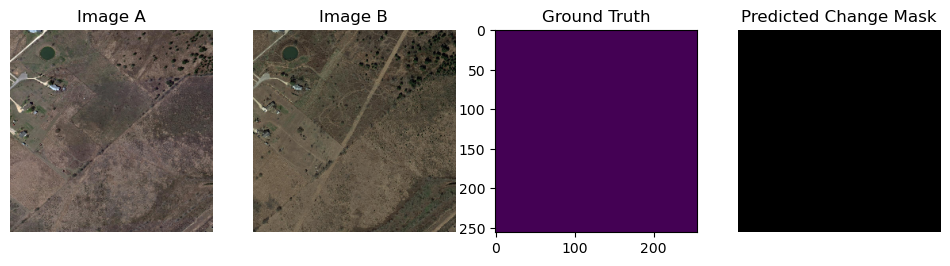

1/1 [==============================] - 0s 34ms/step


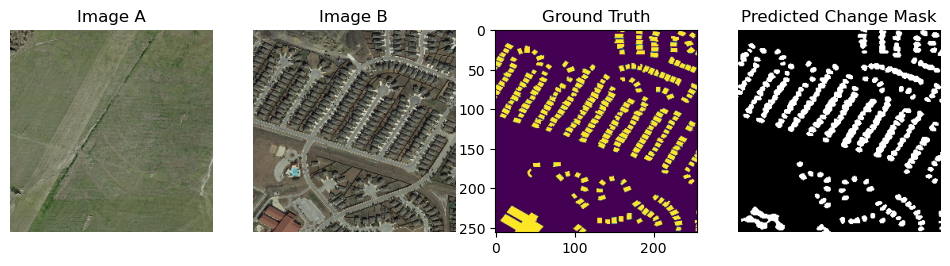

1/1 [==============================] - 0s 47ms/step


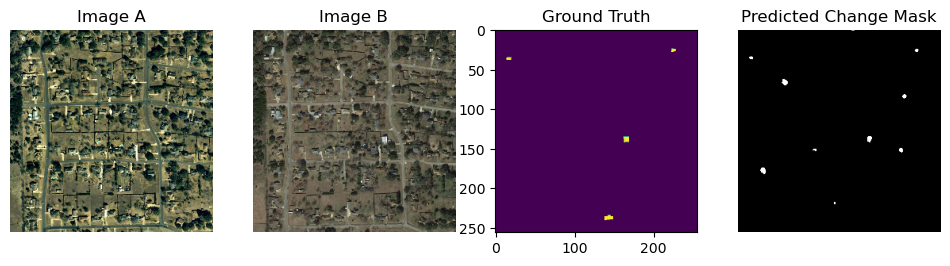

1/1 [==============================] - 0s 32ms/step


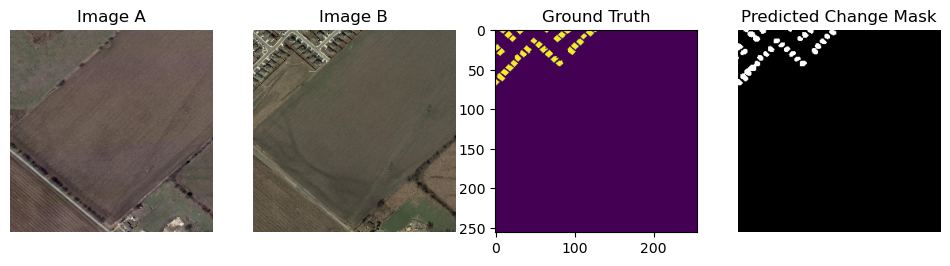

1/1 [==============================] - 0s 34ms/step


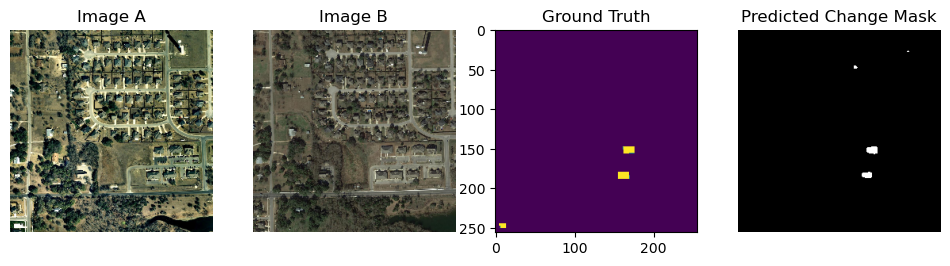

1/1 [==============================] - 0s 40ms/step


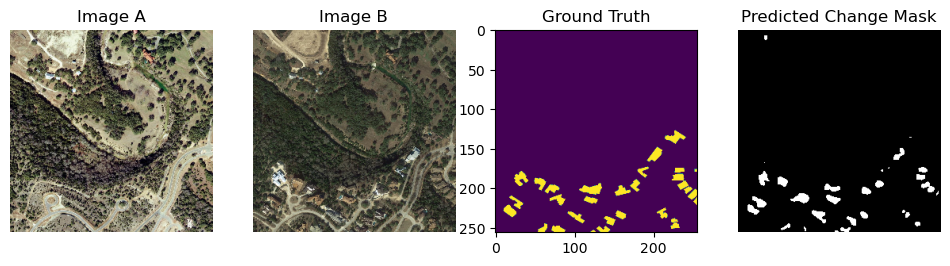

1/1 [==============================] - 0s 43ms/step


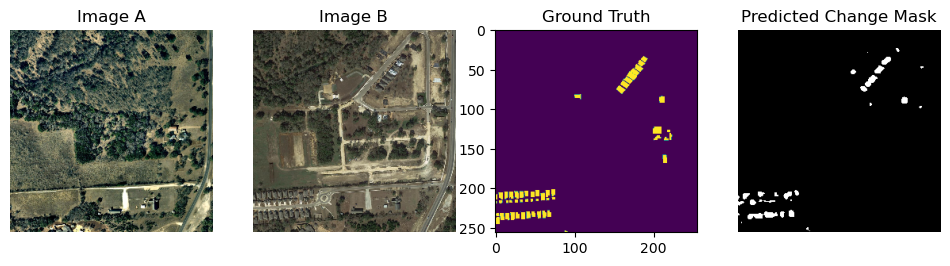

1/1 [==============================] - 0s 40ms/step


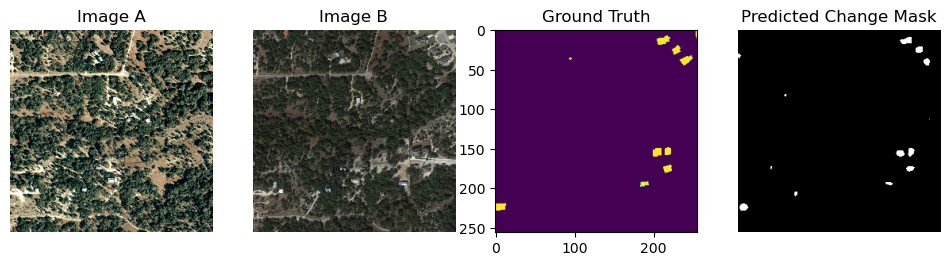

1/1 [==============================] - 0s 36ms/step


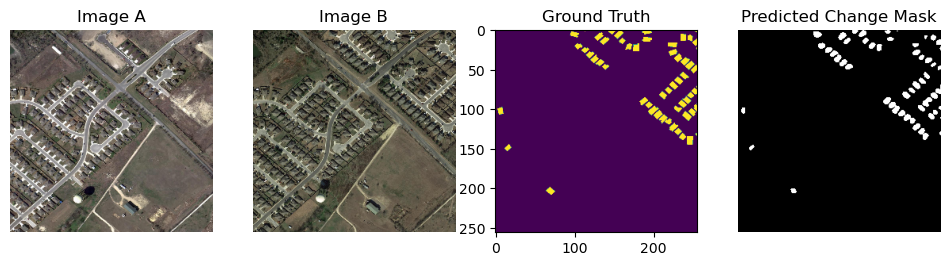

1/1 [==============================] - 0s 51ms/step


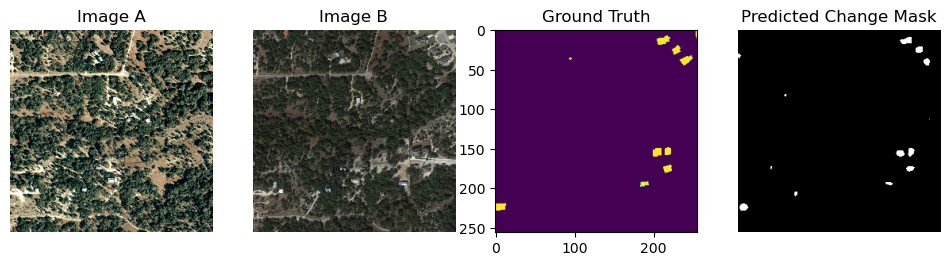

1/1 [==============================] - 0s 33ms/step


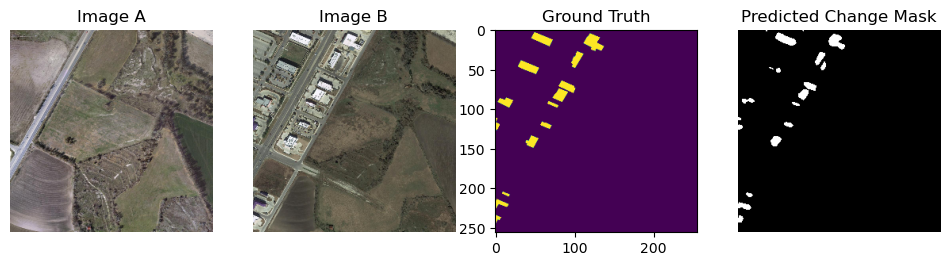

1/1 [==============================] - 0s 34ms/step


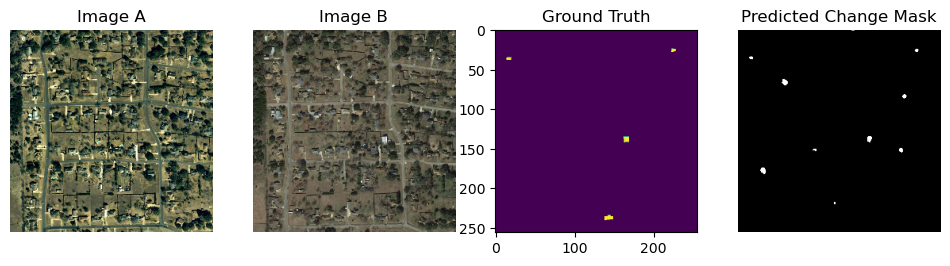

1/1 [==============================] - 0s 38ms/step


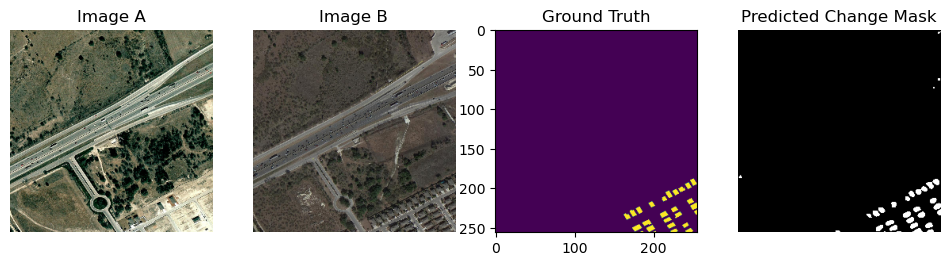

1/1 [==============================] - 0s 37ms/step


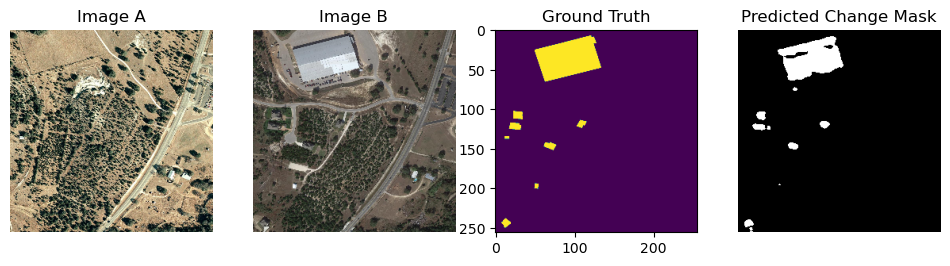

1/1 [==============================] - 0s 44ms/step


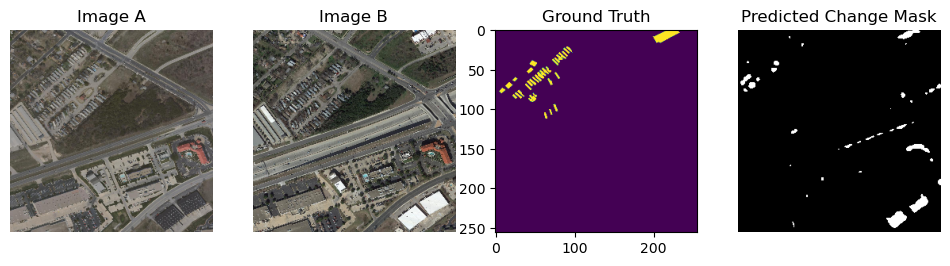

1/1 [==============================] - 0s 38ms/step


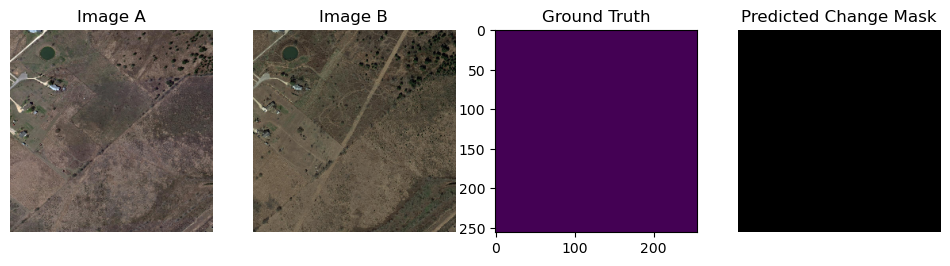

1/1 [==============================] - 0s 37ms/step


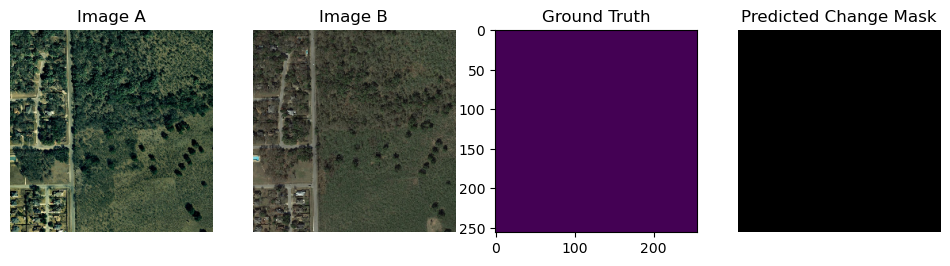

1/1 [==============================] - 0s 36ms/step


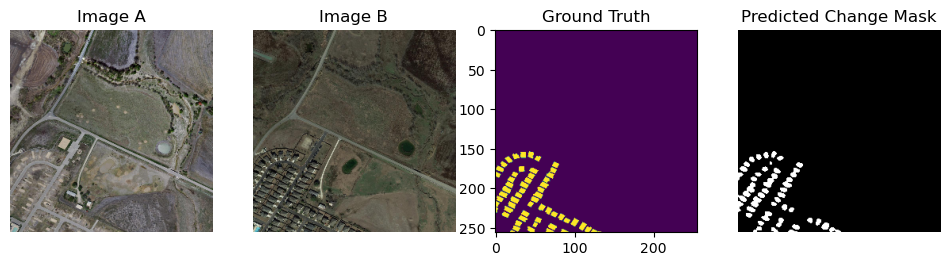

1/1 [==============================] - 0s 50ms/step


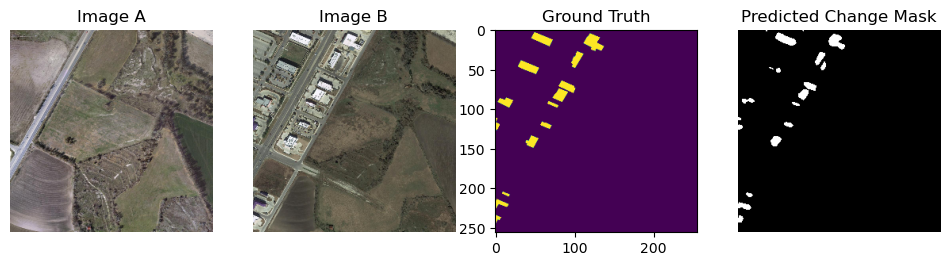

1/1 [==============================] - 0s 41ms/step


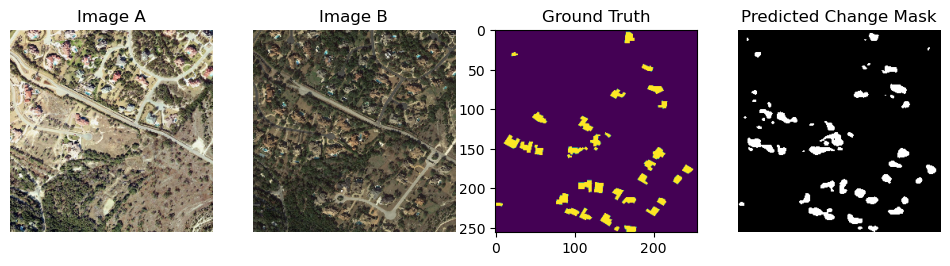

1/1 [==============================] - 0s 43ms/step


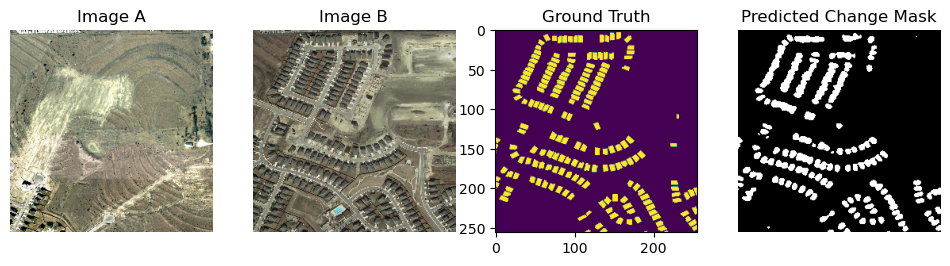

1/1 [==============================] - 0s 49ms/step


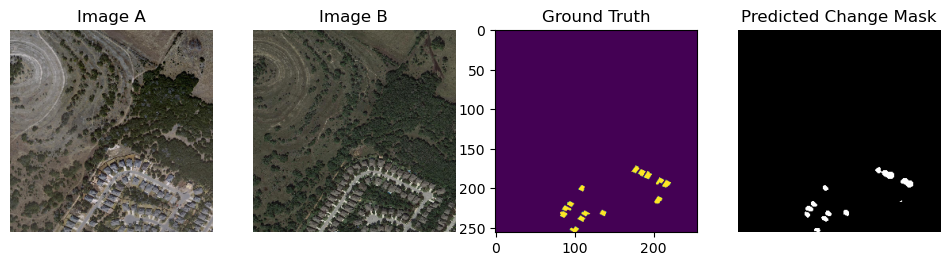

1/1 [==============================] - 0s 34ms/step


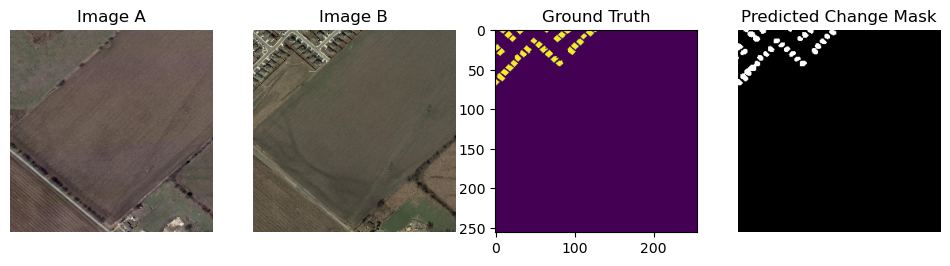

1/1 [==============================] - 0s 33ms/step


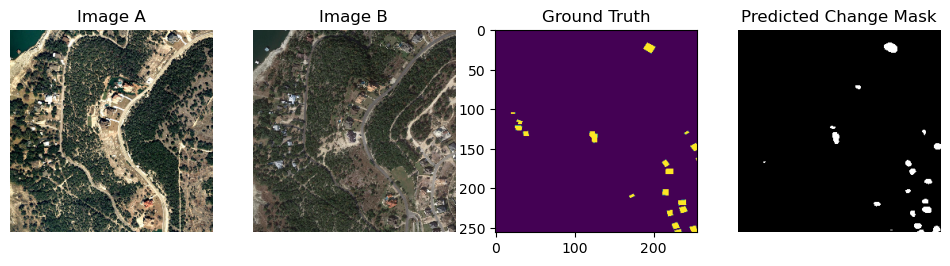

1/1 [==============================] - 0s 33ms/step


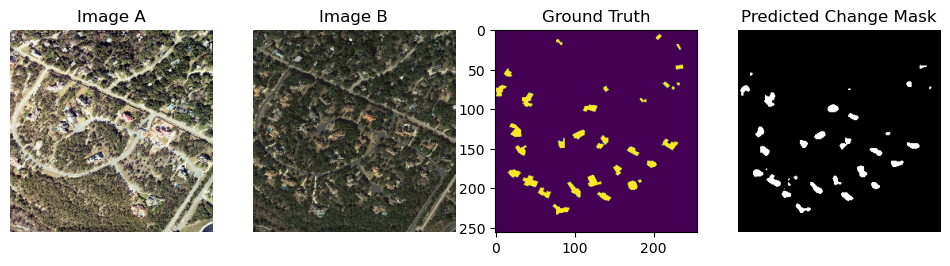

1/1 [==============================] - 0s 37ms/step


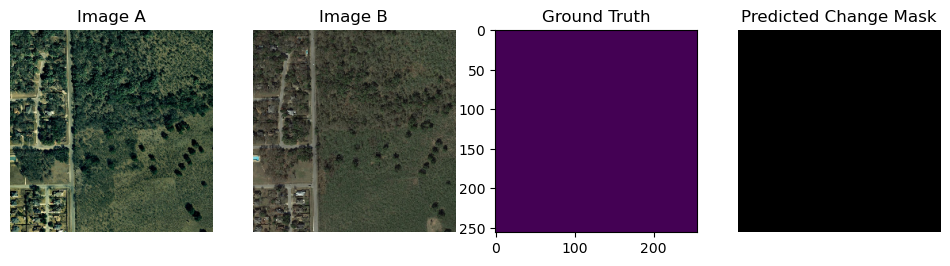

1/1 [==============================] - 0s 46ms/step


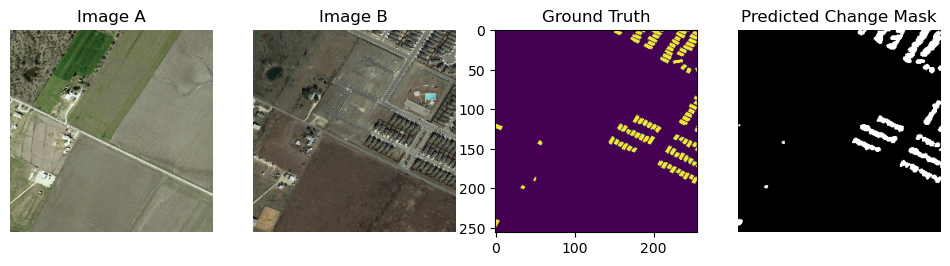

1/1 [==============================] - 0s 48ms/step


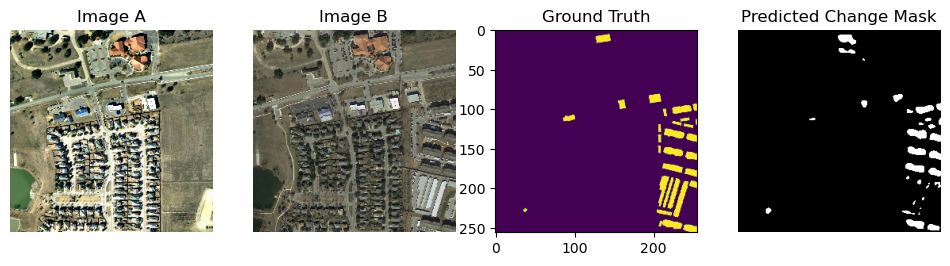

1/1 [==============================] - 0s 38ms/step


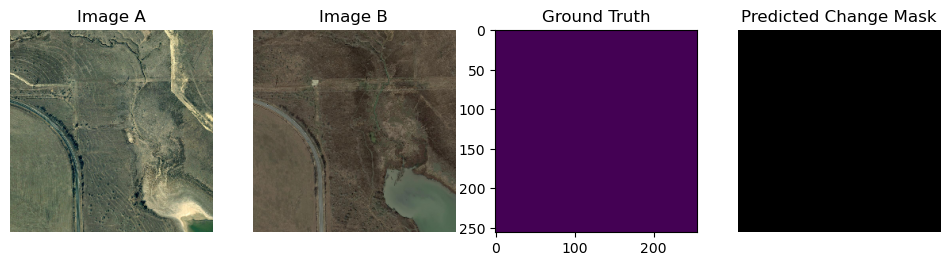

In [13]:
# Visualizing Model and Real Results
def plot_sample(index):
    plt.figure(figsize=(12,4))

    # Girdi görüntüleri
    plt.subplot(1,4,1)
    plt.title("Image A")
    plt.imshow(X_test[index][..., :3])  # ilk 3 kanal
    plt.axis('off')

    plt.subplot(1,4,2)
    plt.title("Image B")
    plt.imshow(X_test[index][..., 3:6])  # sonraki 3 kanal
    plt.axis('off')

    plt.subplot(1,4,3)
    plt.title("Ground Truth")
    plt.imshow(Y_test[index])

    # Tahmin edilen mask
    pred_mask = base_model.predict(X_test[index:index+1])[0,...,0]
    pred_mask = (pred_mask > 0.5).astype(np.uint8)

    plt.subplot(1,4,4)
    plt.title("Predicted Change Mask")
    plt.imshow(pred_mask, cmap='gray')
    plt.axis('off')

    plt.show()

# Samples(10)
for i in range(30):
    x = randint(1,100)
    plot_sample(x)

4/4 [==============================] - 2s 548ms/step


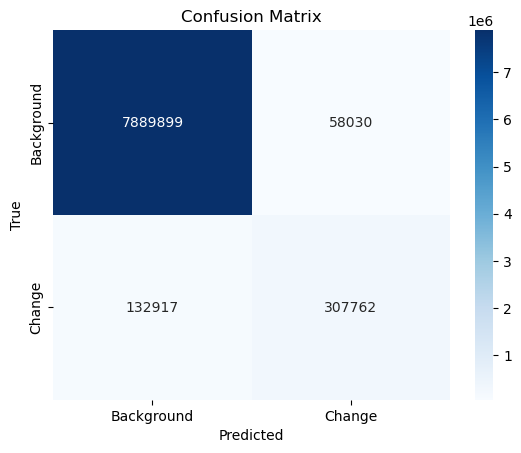

In [14]:
from sklearn.metrics import confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Predict
y_pred = base_model.predict(X_test)
y_pred = (y_pred > 0.5).astype(np.uint8)

# Ground truth'u da binary yap ve tipini düzelt
y_true = (Y_test > 0.5).astype(np.uint8)

# Flatten both
y_pred_flat = y_pred.flatten()
y_true_flat = y_true.flatten()

# Confusion matrix
cm = confusion_matrix(y_true_flat, y_pred_flat)

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=["Background", "Change"], 
            yticklabels=["Background", "Change"])
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

In [15]:
from sklearn.metrics import precision_score, recall_score, f1_score

print("Precision:", precision_score(y_true_flat, y_pred_flat))
print("Recall:   ", recall_score(y_true_flat, y_pred_flat))
print("F1 Score: ", f1_score(y_true_flat, y_pred_flat))


Precision: 0.8413579301898346
Recall:    0.6983813614898826
F1 Score:  0.7632314119168575
